# Hyperparameter Sweep: MPC w/ SQP

In [25]:
import functools
from typing import Callable

import cvxpy as cp
import dynamaxsys
import equinox as eqx
import jax
import jax.numpy as jnp
import numpy as np
from RocketDynamics import RocketDynamics
import matplotlib.pyplot as plt
from utils import (
    PD_controller,
    animate_rocket_trajectory,
    closed_loop_sim,
    simulate_closed_loop,
    open_loop_sim,
    plot_rocket_trajectory,
    plot_mpc_sqp_predictions,
)

from scp_mpc import (  # TODO: remove most of these function calls from the main notebook
    SQP,
)

## Model Preditive Control

### Problem Hyperparameters

In [26]:
initial_state = jnp.array(
    [5.0, 15.0, -0.2, -0.2, -3.0, 0.0]
    # px, pz, theta, vx, vz, omega
)

max_sqp_iterations_planning = 100
max_sqp_iterations_tracking = 10
sqp_convergence_tol = 1e-3
n_steps_total = 300
mpc_horizon = 30

# slack penalties
theta_limit_slack_penalty = 1e7
above_ground_slack_penalty = 1e5

# Planning SQP costs
state_costs_sqp = np.array([1.0, 0.0, 50.0, 0.5, 0.5, 10.0])
control_costs_sqp = np.array([0.00001, 0.00001, 0.000001])
terminal_state_costs_sqp = np.array([1.0, 5.0, 50.0, 10.0, 8, 5]) * 1000
state_trust_region_penalty_sqp = 1000.0
control_trust_region_penalty_sqp = 100.0

# Tracking MPC costs
state_costs_mpc = np.array([10.0, 10.0, 10.0, 10.0, 10.0, 10.0])
control_costs_mpc = np.array([1.0, 1.0, 1.0])
terminal_state_costs_mpc = np.array([1.0, 10.0, 20.0, 0.5, 0.5, 10.0]) * 100
state_trust_region_penalty_mpc = 10.0
control_trust_region_penalty_mpc = 10.0


dt = 0.01

# TODO: add SCvx-specific hyperparameters after implementing SCvx

### Define Rocket Dynamics Parameters

In [27]:
params = {
    "mass_thruster": 10.0,  # (kg) mass of the thruster
    "mass_body": 15.0,  # (kg) mass of the rocket body
    "length": 1.0,  # (m) length of the rocket
    "gravity": 9.81,  # (m*s^-2) gravity constant
}
# params = {
#     "mass_thruster": 100.0,  # (kg) mass of the thruster # 10.0
#     "mass_body": 15000,  # (kg) mass of the rocket body # 15.0
#     "length": 7,  # (m) length of the rocket # 1.0
#     "gravity": 1.62,  # (m*s^-2) gravity constant # 9.81
# }

rocket_ct = RocketDynamics(params)
rocket_dt = dynamaxsys.get_discrete_time_dynamics(
    rocket_ct, dt=dt
)  # discrete time dynamics

# set up the control limits
thrust_to_weight_ratio = 3  # 1.3
rocket_weight = (params["mass_thruster"] + params["mass_body"]) * params["gravity"]
T_base_z_max = rocket_weight * thrust_to_weight_ratio  # vertical thrust limit
T_base_x_max = T_base_z_max * 0.75  # horizontal thrust limit; feel free to adjust this
T_nose_max = T_base_x_max * 0.75  # nose thrust limit; feel free to adjust this

# set up the lower and upper limits for the control inputs
lower_control_limit = jnp.array(
    [-T_base_x_max, 0.0, -T_nose_max]
)  # lower limits for the control inputs
upper_control_limit = jnp.array(
    [T_base_x_max, T_base_z_max, T_nose_max]
)  # upper limits for the control inputs
limits = [lower_control_limit, upper_control_limit]


state_dim = rocket_ct.state_dim  # 6, state dimension
control_dim = rocket_ct.control_dim  # 3, control dimension

### Define the offline optimization problem to solve with SQP (full trajectory)

In [28]:
Q = cp.Constant(
    np.diag(state_costs_sqp)
)  # encourage the rocket to stay upright and slow; state: [p_x, p_z, theta, v_x, v_z, omega]
R = cp.Constant(
    np.diag(control_costs_sqp)
)  # control cost matrix; control: [T_x, T_z, T_theta]
QN = cp.Constant(
    np.diag(terminal_state_costs_sqp)
    # TODO: make these parameters so I can update terminal costs between MPC iterations
)  # terminal cost matrix; state: [p_x, p_z, theta, v_x, v_z, omega]
QTRP = cp.Constant(
    np.eye(state_dim) * state_trust_region_penalty_sqp
)  # trust region penalty for state deviations.
RTRP = cp.Constant(
    np.eye(control_dim) * control_trust_region_penalty_sqp
)  # trust region penalty for control deviations.
# trust region penalty for control deviations.

# set up cvxpy optimization variables
states = cp.Variable(
    (n_steps_total + 1, state_dim), name="states"
)  # state trajectory [n_steps+1, state_dim]
controls = cp.Variable(
    (n_steps_total, control_dim), name="controls"
)  # control trajectory [n_steps, control_dim]
theta_limit_slack = cp.Variable(n_steps_total + 1, nonneg=True)
above_ground_slack = cp.Variable(n_steps_total + 1, nonneg=True)

# set up the A, B, C matrices as parameters since they will be updated at each SQP iteration
As = cp.Parameter((n_steps_total, state_dim, state_dim), name="As")
Bs = cp.Parameter((n_steps_total, state_dim, control_dim), name="Bs")
Cs = cp.Parameter((n_steps_total, state_dim), name="Cs")

# set up the previous state and control parameters since they will be updated at each SQP iteration
previous_states = cp.Parameter((n_steps_total + 1, state_dim), name="previous_states")
previous_controls = cp.Parameter((n_steps_total, control_dim), name="previous_controls")

# set up the goal state as a parameter in case you want to change the goal state later on
target_state = cp.Parameter((state_dim), name="target_state")

# set up the initial state parameter in case you want to change the initial state later on
initial_state = cp.Parameter(state_dim, name="initial_state")

# set up control constraints
u_min = cp.Constant(lower_control_limit, name="u_min")
u_max = cp.Constant(upper_control_limit, name="u_max")

# calculate state and control deviations from the last solution for trust region penalty
state_deviation = states - previous_states
control_deviation = controls - previous_controls
terminal_state_error = states[-1] - target_state

# vectorize each cost matrix
Q_diag = np.diag(Q.value)
R_diag = np.diag(R.value)
QTRP_diag = np.diag(QTRP.value)
RTRP_diag = np.diag(RTRP.value)
QN_diag = np.diag(QN.value)

# elementwise multiplication with the states/controls at every time step via broadcasting
Q_cost = cp.sum(cp.multiply(Q_diag, cp.square(states)))
R_cost = cp.sum(cp.multiply(R_diag, cp.square(controls)))
QTRP_cost = cp.sum(cp.multiply(QTRP_diag, cp.square(state_deviation)))
RTRP_cost = cp.sum(cp.multiply(RTRP_diag, cp.square(control_deviation)))
QN_cost = cp.sum(cp.multiply(QN_diag, cp.square(terminal_state_error)))

# slack costs
slack_cost = cp.sum(theta_limit_slack_penalty * theta_limit_slack) + cp.sum(
    above_ground_slack_penalty * above_ground_slack
)

objective = Q_cost + R_cost + QTRP_cost + RTRP_cost + QN_cost + slack_cost

# constraints
dynamics_constraint = [
    states[k + 1] == As[k] @ states[k] + Bs[k] @ controls[k] + Cs[k]
    for k in range(n_steps_total)
]
initial_cond = states[0, :] == initial_state

THETA_LIMIT = 0.25  # rad

state_constraints = [
    states[:, 1] >= 0 - above_ground_slack,  # stay above ground
    states[:, 2] <= THETA_LIMIT + theta_limit_slack,  # don't flip
    states[:, 2] >= -THETA_LIMIT - theta_limit_slack,  # don't flip the other way either
]
control_constraints = [
    controls >= u_min,
    controls <= u_max,
]  # constrains all controls at all times
constraints = [
    *dynamics_constraint,
    initial_cond,
    *state_constraints,
    *control_constraints,
]

planning_problem = cp.Problem(cp.Minimize(objective), constraints)

### Set parameters

In [29]:
target_state.value = np.array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
initial_state.value = np.array([1.0, 7.0, 0.1, 0.2, -0.1, -0.05])
# initial_state.value = np.array([8.0, 15.0, 0.2, -1.0, -0.5, -0.1])
# previous_states and previous_controls are set in the SQP loop

### Make an initial guess trajectory for SQP

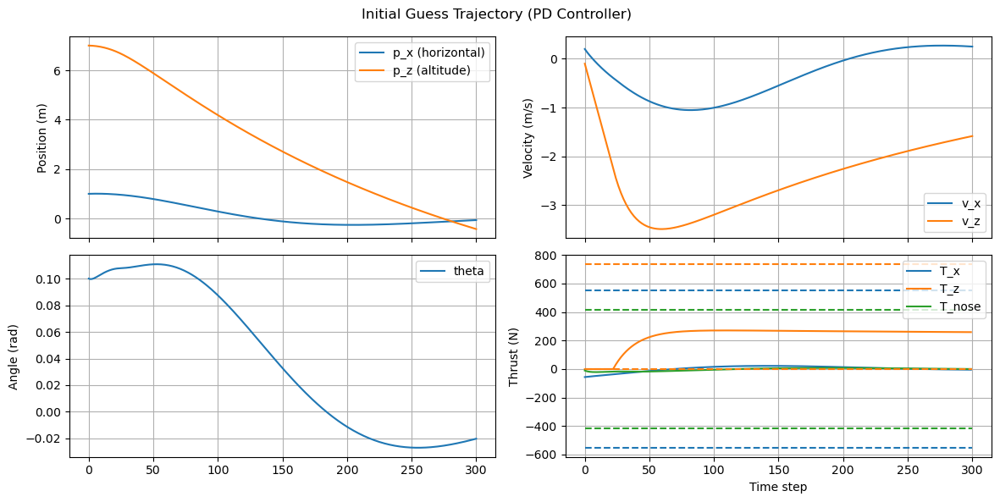

In [30]:
# use PD controller initial guess

initial_state_value = np.array(initial_state.value)
target_state_value = np.array(target_state.value)

gains = {
    "Kp_x": 50.0,
    "Kd_x": 30.0,
    "Kp_z": 50.0,
    "Kd_z": 150.0,
    "Kp_theta": 150.0,
    "Kd_theta": 100.0,
}.values()
# gains = {
#     "Kp_x": 5000.0,
#     "Kd_x": 30000.0,
#     "Kp_z": 5000.0,
#     "Kd_z": 1500000.0,
#     "Kp_theta": 150000.0,
#     "Kd_theta": 1000000.0,
# }.values()


controller = functools.partial(
    PD_controller, target=target_state_value, gains=gains, limits=limits
)
states_initial_guess, controls_initial_guess = closed_loop_sim(
    rocket_dt, initial_state_value, controller, n_steps_total
)

initial_guess = {
    "states": states_initial_guess,  # only take the first mpc_horizon+1 steps for the initial guess
    "controls": controls_initial_guess,  # only take the first mpc_horizon steps for the initial guess
}

plot_rocket_trajectory(
    states_initial_guess,
    controls_initial_guess,
    lower=lower_control_limit,
    upper=upper_control_limit,
    title="Initial Guess Trajectory (PD Controller)",
)

### Run SQP to solve full trajectory

/Users/jimmy/opt/anaconda3/envs/ctrl-3.11/lib/python3.11/site-packages/cvxpy/reductions/solvers/solving_chain.py:251: UserWarning: Your problem has too many parameters for efficient DPP compilation. We suggest setting 'ignore_dpp = True'.
  warnings.warn(
/Users/jimmy/opt/anaconda3/envs/ctrl-3.11/lib/python3.11/site-packages/cvxpy/reductions/solvers/solving_chain_utils.py:30: UserWarning: The problem includes expressions that don't support CPP backend. Defaulting to the SCIPY backend for canonicalization.
  warnings.warn(UserWarning(


SQP iteration 1/100	 Status: optimal	 Cost: 141223.01570973475
SQP iteration 2/100	 Status: optimal	 Cost: 127579782.00709768
SQP iteration 3/100	 Status: optimal	 Cost: 3988662.9951060475
SQP iteration 4/100	 Status: optimal	 Cost: 299141553.7065393
SQP iteration 5/100	 Status: optimal	 Cost: 500334765.7259562
SQP iteration 6/100	 Status: optimal	 Cost: 210052776.946794
SQP iteration 7/100	 Status: optimal	 Cost: 47355906.636121094
SQP iteration 8/100	 Status: optimal	 Cost: 4579619.901825261
SQP iteration 9/100	 Status: optimal	 Cost: 76646.15971564787
SQP iteration 10/100	 Status: optimal	 Cost: 55175.877642774045
SQP iteration 11/100	 Status: optimal	 Cost: 54298.002525571326
SQP iteration 12/100	 Status: optimal	 Cost: 53870.89379585904
SQP iteration 13/100	 Status: optimal	 Cost: 52537.50940909935
SQP iteration 14/100	 Status: optimal	 Cost: 52193.63634283514
SQP iteration 15/100	 Status: optimal	 Cost: 52735.14780204779
SQP iteration 16/100	 Status: optimal	 Cost: 52392.59288389

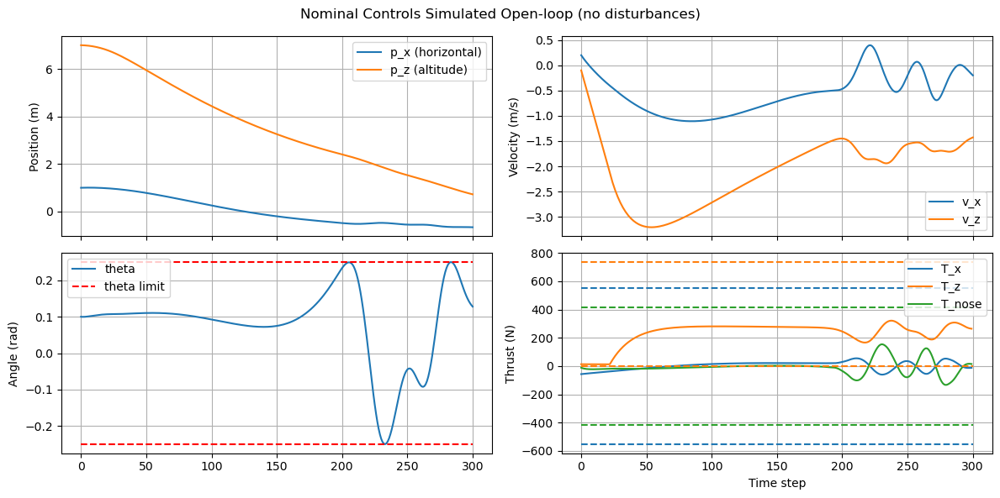

In [31]:
nominal_controls_list, solver_states_list, sqp_costs, status_list = SQP(
    planning_problem,
    rocket_dt,
    initial_guess,
    max_sqp_iterations=max_sqp_iterations_planning,
    convergence_tol=sqp_convergence_tol,
    verbose=True,
)

# extract the final nominal control trajectory from the last SQP iteration
nominal_controls = np.array(nominal_controls_list[-1])

# # compute states with true nonlinear dynamics. Recall that states.value is the optimized trajectory based on linearized dynamics.
# nominal_states = open_loop_sim(rocket_dt, initial_state_value, nominal_controls)
# ACTUALLY DON'T DO THAT BC THEY ARE WORSE... USE SOLVER STATES
nominal_states = np.array(solver_states_list[-1])


plot_rocket_trajectory(
    nominal_states,
    nominal_controls,
    lower_control_limit,
    upper_control_limit,
    title="Nominal Controls Simulated Open-loop (no disturbances)",
    theta_limit=THETA_LIMIT,
)

In [32]:
animate_rocket_trajectory(nominal_states, nominal_controls, thrust_limit=upper_control_limit)

## Define tracking MPC optimization problem

In [33]:
Q = cp.Constant(
    np.diag(state_costs_mpc)
)  # encourage the rocket to stay upright and slow; state: [p_x, p_z, theta, v_x, v_z, omega]
R = cp.Constant(
    np.diag(control_costs_mpc)
)  # control cost matrix; control: [T_x, T_z, T_theta]
QN = cp.Constant(
    np.diag(terminal_state_costs_mpc)
    # TODO: make these parameters so I can update terminal costs between MPC iterations
)  # terminal cost matrix; state: [p_x, p_z, theta, v_x, v_z, omega]
QTRP = cp.Constant(
    np.eye(state_dim) * state_trust_region_penalty_mpc
)  # trust region penalty for state deviations.
RTRP = cp.Constant(
    np.eye(control_dim) * control_trust_region_penalty_mpc
)  # trust region penalty for control deviations.
# trust region penalty for control deviations.

# set up cvxpy optimization variables
states = cp.Variable(
    (mpc_horizon + 1, state_dim), name="states"
)  # state trajectory [n_steps+1, state_dim]
controls = cp.Variable(
    (mpc_horizon, control_dim), name="controls"
)  # control trajectory [n_steps, control_dim]
theta_limit_slack = cp.Variable(mpc_horizon + 1, nonneg=True)
above_ground_slack = cp.Variable(mpc_horizon + 1, nonneg=True)

# reference window to track nominal trajectory
reference_states = cp.Parameter((mpc_horizon + 1, state_dim), name="reference_states")
reference_controls = cp.Parameter((mpc_horizon, control_dim), name="reference_controls")

# set up the A, B, C matrices as parameters since they will be updated at each SQP iteration
As = cp.Parameter((mpc_horizon, state_dim, state_dim), name="As")
Bs = cp.Parameter((mpc_horizon, state_dim, control_dim), name="Bs")
Cs = cp.Parameter((mpc_horizon, state_dim), name="Cs")

# set up the previous state and control parameters since they will be updated at each SQP iteration
previous_states = cp.Parameter((mpc_horizon + 1, state_dim), name="previous_states")
previous_controls = cp.Parameter((mpc_horizon, control_dim), name="previous_controls")

# set up the initial state parameter in case you want to change the initial state later on
initial_state = cp.Parameter(state_dim, name="initial_state")

# set up control constraints
u_min = cp.Constant(lower_control_limit, name="u_min")
u_max = cp.Constant(upper_control_limit, name="u_max")

# calculate state and control deviations from the last solution for trust region penalty
state_deviation = states - previous_states
control_deviation = controls - previous_controls
terminal_state_error = states[-1] - reference_states[-1]

# vectorize each cost matrix
Q_diag = np.diag(Q.value)
R_diag = np.diag(R.value)
QTRP_diag = np.diag(QTRP.value)
RTRP_diag = np.diag(RTRP.value)
QN_diag = np.diag(QN.value)

# elementwise multiplication with the states/controls at every time step via broadcasting
state_tracking_cost = cp.sum(
    cp.multiply(
        Q_diag, cp.square(states[:mpc_horizon] - reference_states[:mpc_horizon])
    )
)
control_tracking_cost = cp.sum(
    cp.multiply(R_diag, cp.square(controls - reference_controls))
)
QTRP_cost = cp.sum(cp.multiply(QTRP_diag, cp.square(state_deviation)))
RTRP_cost = cp.sum(cp.multiply(RTRP_diag, cp.square(control_deviation)))

terminal_cost = cp.sum(cp.multiply(QN_diag, cp.square(terminal_state_error)))

# slack costs
slack_cost = cp.sum(theta_limit_slack_penalty * theta_limit_slack) + cp.sum(
    above_ground_slack_penalty * above_ground_slack
)

objective = (
    state_tracking_cost
    + control_tracking_cost
    + QTRP_cost
    + RTRP_cost
    + terminal_cost
    + slack_cost
)

# constraints
dynamics_constraint = [
    states[k + 1] == As[k] @ states[k] + Bs[k] @ controls[k] + Cs[k]
    for k in range(mpc_horizon)
]
initial_cond = states[0, :] == initial_state

THETA_LIMIT = 0.25  # rad

state_constraints = [
    states[:, 1] >= 0 - above_ground_slack,  # stay above ground
    states[:, 2] <= THETA_LIMIT + theta_limit_slack,  # don't flip
    states[:, 2] >= -THETA_LIMIT - theta_limit_slack,  # don't flip the other way either
]
control_constraints = [
    controls >= u_min,
    controls <= u_max,
]  # constrains all controls at all times
constraints = [
    *dynamics_constraint,
    initial_cond,
    *state_constraints,
    *control_constraints,
]

tracking_problem = cp.Problem(cp.Minimize(objective), constraints)

### Run MPC

In [34]:
mpc_states_trajectory = [initial_state_value]
mpc_controls_trajectory = []
current_state = np.array(initial_state_value)

# initialize warm start from nominal trajectory
initial_guess = {
    "states": np.array(nominal_states[: mpc_horizon + 1]),
    "controls": np.array(nominal_controls[:mpc_horizon]),
}

verbose = True
for i in range(n_steps_total):  # step through the nominal trajectory length
    print(f"MPC iteration: {i} / {n_steps_total}")

    # slide reference window along nominal trajectory
    end_idx = min(i + mpc_horizon + 1, len(nominal_states))
    ref_states_window = nominal_states[i:end_idx]
    ref_controls_window = nominal_controls[i : end_idx - 1]

    print(f"\tWindow: {i}:{end_idx}")
    # pad if near the end of the nominal trajectory
    if ref_states_window.shape[0] < mpc_horizon + 1:
        pad_s = mpc_horizon + 1 - ref_states_window.shape[0]
        pad_c = mpc_horizon - ref_controls_window.shape[0]
        ref_states_window = jnp.concatenate(
            [ref_states_window, jnp.tile(nominal_states[-1], (pad_s, 1))]
        )
        ref_controls_window = jnp.concatenate(
            [ref_controls_window, jnp.zeros((pad_c, control_dim))]
        )

    reference_states.value = np.array(ref_states_window)
    reference_controls.value = np.array(ref_controls_window)
    initial_state.value = current_state

    # run SQP (fewer iterations needed since warm start is good)
    controls_list, solver_states_list, costs, status_list = SQP(
        tracking_problem,
        rocket_dt,
        initial_guess,
        max_sqp_iterations=max_sqp_iterations_tracking,
        convergence_tol=sqp_convergence_tol,
    )

    print(f"\tSQP iterations: {len(controls_list) - 1}")
    print(f"\tStatus: {tracking_problem.status}")

    # apply first control
    control_input = controls_list[-1][0]

    # if i == 100:
    #     plot_rocket_trajectory(
    #         ref_states_window,
    #         ref_controls_window,
    #         lower_control_limit,
    #         upper_control_limit,
    #         title="Nominal Trajectory Window",
    #         theta_limit=THETA_LIMIT,
    #     )

    #     open_loop_states = open_loop_sim(
    #         rocket_dt, initial_state.value, controls.value
    #     )

    #     plot_rocket_trajectory(
    #         open_loop_states,
    #         controls.value,
    #         lower_control_limit,
    #         upper_control_limit,
    #         title="MPC tracking trajectory",
    #         theta_limit=THETA_LIMIT,
    #     )

    # simulate with control to update current_state for the next iteration
    current_state = np.array(
        rocket_dt(current_state, control_input, jnp.zeros(state_dim))
    )

    # log states and controls
    mpc_controls_trajectory.append(control_input)
    mpc_states_trajectory.append(current_state)

    # warm start: re-simulate from actual current state with shifted controls
    shifted_controls = np.vstack([controls_list[-1][1:], controls_list[-1][-1:]])
    initial_guess = {
        "states": np.array(
            open_loop_sim(
                rocket_dt, jnp.array(current_state), jnp.array(shifted_controls)
            )
        ),
        "controls": shifted_controls,
    }

mpc_states_trajectory = np.array(mpc_states_trajectory)
mpc_controls_trajectory = np.array(mpc_controls_trajectory)

MPC iteration: 0 / 300
	Window: 0:31


/Users/jimmy/opt/anaconda3/envs/ctrl-3.11/lib/python3.11/site-packages/cvxpy/reductions/solvers/solving_chain_utils.py:30: UserWarning: The problem includes expressions that don't support CPP backend. Defaulting to the SCIPY backend for canonicalization.
  warnings.warn(UserWarning(


	SQP iterations: 3
	Status: optimal
MPC iteration: 1 / 300
	Window: 1:32
	SQP iterations: 10
	Status: optimal
MPC iteration: 2 / 300
	Window: 2:33
	SQP iterations: 10
	Status: optimal
MPC iteration: 3 / 300
	Window: 3:34
	SQP iterations: 10
	Status: optimal
MPC iteration: 4 / 300
	Window: 4:35
	SQP iterations: 10
	Status: optimal
MPC iteration: 5 / 300
	Window: 5:36
	SQP iterations: 10
	Status: optimal
MPC iteration: 6 / 300
	Window: 6:37
	SQP iterations: 10
	Status: optimal
MPC iteration: 7 / 300
	Window: 7:38
	SQP iterations: 10
	Status: optimal
MPC iteration: 8 / 300
	Window: 8:39
	SQP iterations: 10
	Status: optimal
MPC iteration: 9 / 300
	Window: 9:40
	SQP iterations: 10
	Status: optimal
MPC iteration: 10 / 300
	Window: 10:41
	SQP iterations: 10
	Status: optimal
MPC iteration: 11 / 300
	Window: 11:42
	SQP iterations: 10
	Status: optimal
MPC iteration: 12 / 300
	Window: 12:43
	SQP iterations: 10
	Status: optimal
MPC iteration: 13 / 300
	Window: 13:44
	SQP iterations: 10
	Status: op

### Plot results

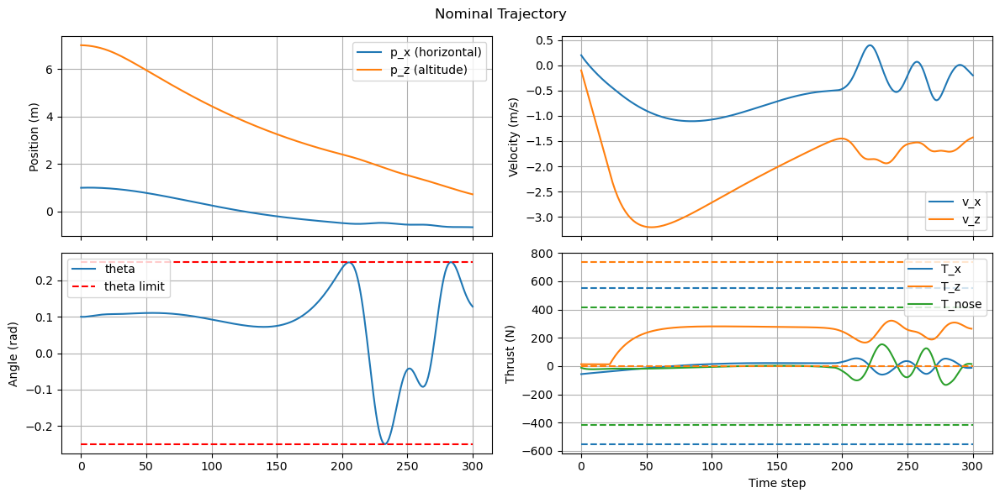

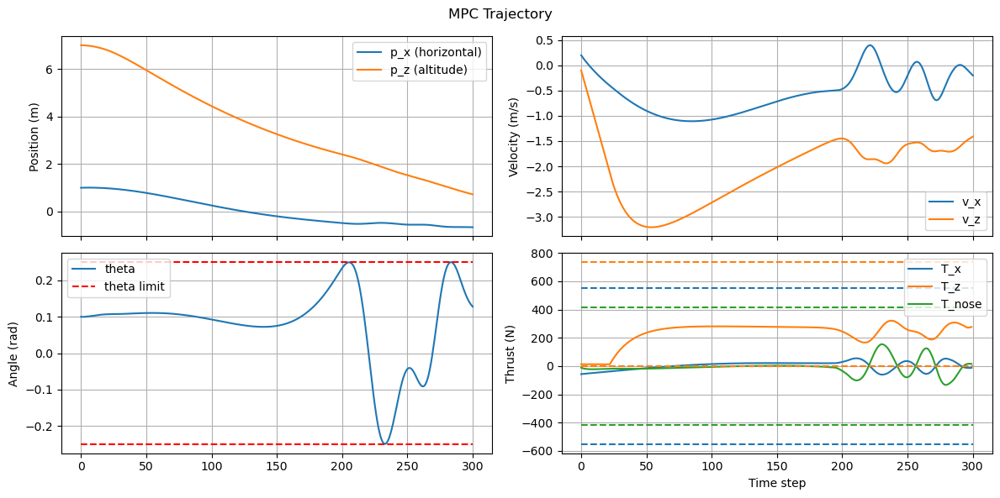

In [35]:
plot_rocket_trajectory(
    np.array(nominal_states),
    np.array(nominal_controls),
    lower_control_limit,
    upper_control_limit,
    title="Nominal Trajectory",
    theta_limit=THETA_LIMIT,
)

plot_rocket_trajectory(
    np.array(mpc_states_trajectory),
    np.array(mpc_controls_trajectory),
    lower_control_limit,
    upper_control_limit,
    title="MPC Trajectory",
    theta_limit=THETA_LIMIT,
)

In [36]:
animate_rocket_trajectory(
    mpc_states_trajectory,
    mpc_controls_trajectory,
    thrust_limit=upper_control_limit
)

## Hyperparameter Sweep


In [37]:
baseline = {
    "mpc_horizon": 30,
    "max_sqp_iterations": 3,
    "state_trust_region_penalty": 100.0,
    "control_trust_region_penalty": 100.0,
    "theta_limit_slack_penalty": 1e5,
    "above_ground_slack_penalty": 1e3,
    "state_costs": [1.0, 10.0, 20.0, 0.5, 0.5, 10.0],
    "terminal_state_costs": [100.0, 500.0, 1000.0, 1000.0, 800.0, 500.0],
    "control_costs": [0.0001, 0.0001, 0.00],
}

sweeps = {
    "mpc_horizon": [10, 20, 30, 50, 75],
    "max_sqp_iterations": [1, 2, 3, 5, 10],
    "state_trust_region_penalty": [10.0, 50.0, 100.0, 500.0, 1000.0],
    "control_trust_region_penalty": [10.0, 50.0, 100.0, 500.0, 1000.0],
}

# disturbance_conditions = {
#     "none": lambda t, x: jnp.zeros(state_dim),
#     "small_impulse": lambda t, x: jnp.array([0, 0, 0, 5.0, 0, 0]) if t == 50 else jnp.zeros(state_dim),
#     "large_impulse": lambda t, x: jnp.array([0, 0, 0, 5.0, -2.0, 0]) if t == 50 else jnp.zeros(state_dim),
#     "persistent_noise": lambda t, x: jax.random.normal(key, shape=(state_dim,)) * 0.2,
# }



In [38]:
# test build_mpc_problem and run_mpc

